# Introduction
Notebook contains EDA of [Soccer detailed players match data](https://www.kaggle.com/datasets/spicemix/soccer-detailed-players-match-data?resource=download) dataset and is first milestone of clustering project for Introduction to Machine Learning university course

## Initial data description



* details of the match statistics for each player 
* two tables with the same structure - both home and away teams
* each row represents one player for the given match
* 127 columns


## Data import

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings('ignore')

In [3]:
home_df = pd.read_csv("..\data\players_home_matches.csv")
away_df = pd.read_csv("..\data\players_away_matches.csv")

## EDA
I will focus on the home matches as both tables have the same structure

In [14]:
home_df.head()

,Unnamed: 0,awayScore,awayTeamName,awayTeamTacticalSchema,homeScore,homeTeamName,homeTeamTacticalSchema,matchDate,matchWeek,playerName,...,touches_att_3rd,touches_att_pen_area,touches_def_3rd,touches_def_pen_area,touches_live_ball,touches_mid_3rd,xa,xg,team_name,championship_name
0,0,0,Alavés,(4-1-4-1),2,Athletic Club,(4-2-3-1),2019-09-22,5,Raúl García,...,28.0,6.0,2.0,0.0,50.0,23.0,0.1,0.9,Athletic Club,liga
1,1,0,Atlético Madrid,(4-4-2),2,Athletic Club,(4-2-3-1),2019-03-16,28,Mikel San José,...,9.0,3.0,10.0,1.0,49.0,31.0,0.1,0.0,Athletic Club,liga
2,2,0,Real Betis,(3-1-4-2),1,Athletic Club,(4-2-3-1),2019-01-27,21,Óscar de Marcos,...,24.0,6.0,3.0,1.0,32.0,7.0,0.4,0.1,Athletic Club,liga
3,3,1,Real Sociedad,(4-2-3-1),0,Athletic Club,(4-2-3-1),2020-12-31,16,Unai López,...,3.0,1.0,3.0,1.0,11.0,8.0,0.0,0.1,Athletic Club,liga
4,4,2,Rayo Vallecano,(4-2-3-1),3,Athletic Club,(4-2-3-1),2019-04-14,32,Iñigo Córdoba,...,20.0,3.0,8.0,1.0,43.0,19.0,0.3,0.0,Athletic Club,liga


In [16]:
away_df.head()

,Unnamed: 0,awayScore,awayTeamName,awayTeamTacticalSchema,homeScore,homeTeamName,homeTeamTacticalSchema,matchDate,matchWeek,playerName,...,touches_att_3rd,touches_att_pen_area,touches_def_3rd,touches_def_pen_area,touches_live_ball,touches_mid_3rd,xa,xg,team_name,championship_name
0,0,0,Reims,(3-4-1-2),0,Nice,(4-4-2),2021-08-08,1,Andrew Gravillon,...,3.0,1.0,37.0,8.0,57.0,27.0,0.0,0.0,Nice,ligue 1
1,1,0,Reims,(3-4-1-2),0,Nice,(4-4-2),2021-08-08,1,Ghislain Konan,...,19.0,0.0,21.0,2.0,47.0,28.0,0.0,0.0,Nice,ligue 1
2,2,0,Reims,(3-4-1-2),0,Nice,(4-4-2),2021-08-08,1,Kaj Sierhuis,...,8.0,2.0,4.0,1.0,19.0,7.0,0.1,0.0,Nice,ligue 1
3,3,0,Reims,(3-4-1-2),0,Nice,(4-4-2),2021-08-08,1,Marshall Munetsi,...,2.0,0.0,8.0,3.0,28.0,18.0,0.0,0.0,Nice,ligue 1
4,4,0,Reims,(3-4-1-2),0,Nice,(4-4-2),2021-08-08,1,Mathieu Cafaro,...,7.0,1.0,9.0,1.0,22.0,11.0,0.0,0.0,Nice,ligue 1


In [32]:
home_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76215 entries, 0 to 76214
Data columns (total 127 columns):
 #    Column                       Non-Null Count  Dtype  
---   ------                       --------------  -----  
 0    Unnamed: 0                   76215 non-null  int64  
 1    awayScore                    76215 non-null  int64  
 2    awayTeamName                 76215 non-null  object 
 3    awayTeamTacticalSchema       76215 non-null  object 
 4    homeScore                    76215 non-null  int64  
 5    homeTeamName                 76215 non-null  object 
 6    homeTeamTacticalSchema       76215 non-null  object 
 7    matchDate                    76215 non-null  object 
 8    matchWeek                    76215 non-null  int64  
 9    playerName                   76215 non-null  object 
 10   aerials_lost                 76142 non-null  float64
 11   aerials_won                  76142 non-null  float64
 12   aerials_won_pct              53345 non-null  float64
 13  

In [8]:
columns = home_df.columns[home_df.isnull().mean() > 0.3]
columns

Index(['aerials_won_pct', 'dribble_tackles_pct', 'dribbles_completed_pct'], dtype='object')

In [34]:
null_threshold = 0.5
rows_with_nulls  = home_df[home_df.isnull().sum(axis=1) >= null_threshold*len(home_df.columns)]
rows_with_nulls

,Unnamed: 0,awayScore,awayTeamName,awayTeamTacticalSchema,homeScore,homeTeamName,homeTeamTacticalSchema,matchDate,matchWeek,playerName,...,touches_att_3rd,touches_att_pen_area,touches_def_3rd,touches_def_pen_area,touches_live_ball,touches_mid_3rd,xa,xg,team_name,championship_name
88,88,1,Osasuna,(3-5-2),0,Athletic Club,(3-5-2),2020-02-16,24,Mikel San José,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Athletic Club,liga
856,856,0,Nantes,(3-5-2),1,Rennes,(4-4-2),2021-04-11,32,Romain Salin,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rennes,ligue 1
930,930,2,Nantes,(4-2-3-1),3,Rennes,(4-4-2),2020-01-31,22,Sacha Boey,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rennes,ligue 1
4632,4632,4,Sassuolo,(4-2-3-1),1,Spezia,(4-3-3),2020-09-27,2,Salvador Ferrer,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spezia,seria a
4637,4637,2,Lazio,(3-5-1-1),1,Spezia,(4-3-3),2020-12-05,10,Salvador Ferrer,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spezia,seria a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72928,72928,6,Roma,(3-4-3),1,SPAL,(4-1-4-1),2020-07-22,35,Kevin Bonifazi,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SPAL,NaN
73395,73395,0,Granada,(4-3-3),4,Rayo Vallecano,(4-2-3-1),2021-08-29,3,Randy Ntekja,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rayo Vallecano,liga
73412,73412,0,Getafe,(4-4-2),3,Rayo Vallecano,(4-2-3-1),2021-09-18,5,Randy Ntekja,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rayo Vallecano,liga
73431,73431,1,Cádiz,(4-1-4-1),3,Rayo Vallecano,(4-2-3-1),2021-09-26,7,Randy Ntekja,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rayo Vallecano,liga


In [28]:
important_cols = [
    ('attack', ['goals', 'assists', 'shots_total', 'shots_on_target', 'carries', 'pens_att']),
    ('defense', ['interceptions', 'ball_recoveries', 'blocks', 'clearances', 'tackles']),
    ('passing', ['passes', 'passes_pct', 'passes_completed', 'passes_received', 'crosses', 'passes_into_penalty_area']),
    ('dribbling', ['dribbles']),
    ('physical', ['fouls', 'fouled']),
    ('other', ['age', 'minutes'])
]


important_cols = ['goals', 'assists', 'shots_total', 'shots_on_target', 'carries', 'pens_att', 'interceptions', 'ball_recoveries', 'blocks', 'clearances',  'tackles', 'passes', 'passes_pct', 'passes_completed', 'passes_received', 'crosses', 'passes_into_penalty_area', 'dribbles', 'fouls', 'fouled', 'age', 'minutes']

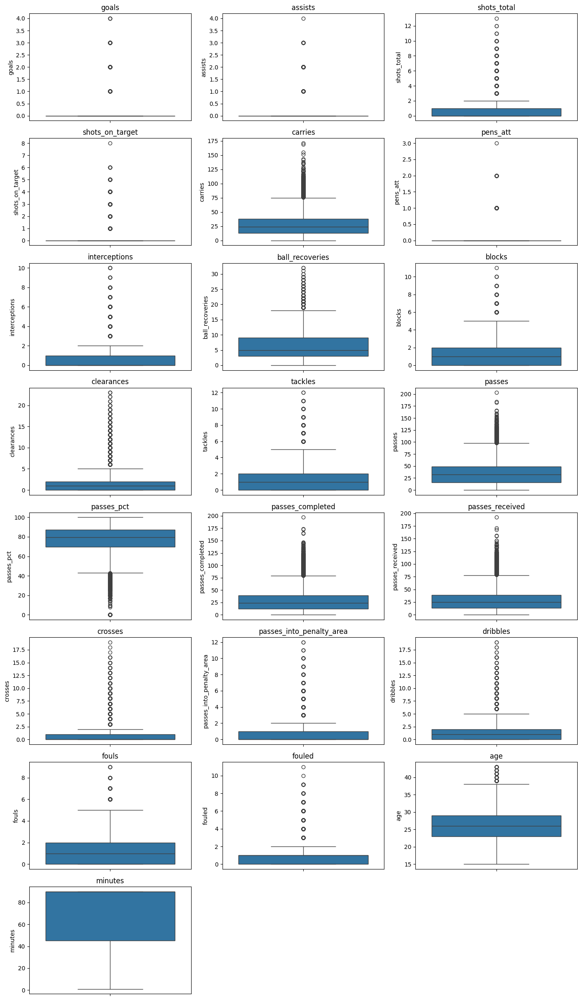

In [30]:
nr_cols = 3
nr_rows = int(np.ceil(len(important_cols) / nr_cols))

# Ustawienie wielkości wykresu
plt.figure(figsize=(14, nr_rows * 3))

# Tworzenie boxplotów
for i, col in enumerate(important_cols):
    plt.subplot(nr_rows, nr_cols, i+1)
    sns.boxplot(y=home_df[col])
    plt.title(col)
    plt.tight_layout()

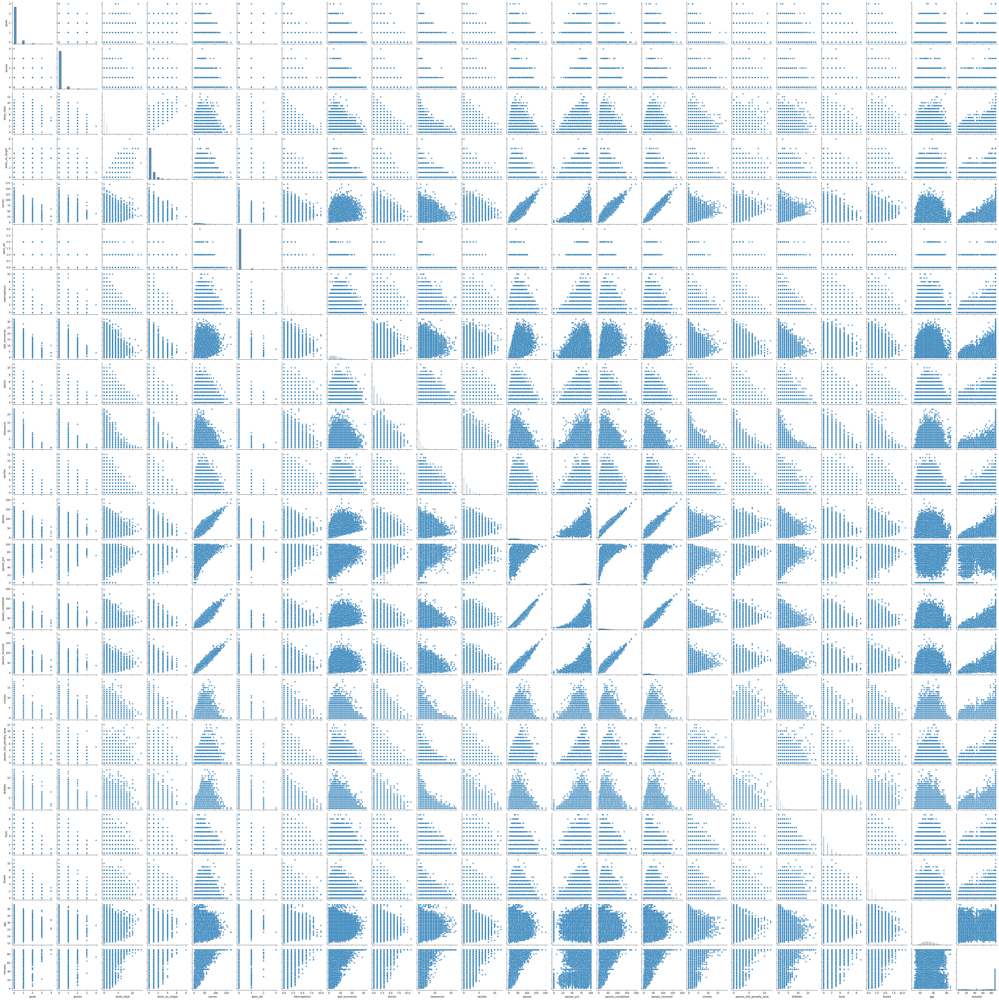

In [36]:
sns.pairplot(home_df[important_cols], plot_kws={'alpha':0.7})

Duplicates

In [5]:
home_df.duplicated().sum()

0

## Final view on the set, description and conclusions

* columns with significant amount of nulls: "dribbles_completed_pct" ~ 50%,  dribble_tackles_pct ~ 45%, aerials_won_pct ~ 30%
* 73 rows lack over 50% of column values
* we selected key features and visualized them
* no duplicates